# Analisis Exploratorio de baches en Vialidades

Primero lo que haremos es importar los modulos que estaremos usando en este notebook

In [47]:
import os 
import folium
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
from scipy.spatial import KDTree
from shapely.geometry import Point
from folium.features import GeoJson, GeoJsonTooltip

#### Localizamos el directorio donde esta nuestro proyecto

In [48]:
directorio = os.path.dirname(os.getcwd())

#### Hacemos una limpieza de los datos inecesarios

In [49]:
baches = gpd.read_file(directorio + '/data/processed/tidy_baches_agebs_hmo.shp')
baches.CVEGEO = baches.CVEGEO.str[-4:]
se_ageb = gpd.read_file(directorio + '/data/processed/tidy_socioeconimico_ageb_hermosillo.shp')
se = pd.read_csv(directorio + '/data/processed/tidy_socioeconomico_hermosillo.csv')

In [50]:
baches = baches[baches['CVEGEO'].isin(se_ageb.CVEGEO.to_list())]
baches = baches.dropna()

In [51]:
# Convertir a un sistema de referencia proyectado (metros) para medir distancias
gdf = baches.to_crs("EPSG:3857")

# Extraer las coordenadas de los puntos en metros
coordinates = [(geom.x, geom.y) for geom in gdf.geometry]

# Crear un KDTree con las coordenadas para encontrar vecinos cercanos
tree = KDTree(coordinates)
processed_indices = set()
new_data = []

# Recorrer cada punto en el GeoDataFrame
for i, point in enumerate(coordinates):
    if i in processed_indices:
        continue
    
    # Encontrar puntos dentro de un radio de 2 metros
    indices = tree.query_ball_point(point, r=2)
    processed_indices.update(indices)
    
    # Filtrar el GeoDataFrame original para estos índices
    close_points = gdf.iloc[indices]
    
    # Obtener el punto medio de las coordenadas
    mean_x = close_points.geometry.x.mean()
    mean_y = close_points.geometry.y.mean()
    mean_point = Point(mean_x, mean_y)
    
    # Obtener la fecha más antigua y un ageb al azar
    oldest_date = close_points['date'].min()
    random_ageb = close_points['CVEGEO'].sample(1).iloc[0]  # Elegir un `ageb` al azar si hay varios
    
    # Guardar el resultado en una lista
    new_data.append({
        "date": oldest_date,
        "CVEGEO": random_ageb,
        "geometry": mean_point
    })

# Crear un nuevo GeoDataFrame con los resultados
new_gdf = gpd.GeoDataFrame(new_data, geometry="geometry", crs="EPSG:3857")

# Opcional: Convertir de nuevo a EPSG:4326 si necesitas las coordenadas originales
new_gdf = new_gdf.to_crs("EPSG:4326")


In [52]:
baches = new_gdf

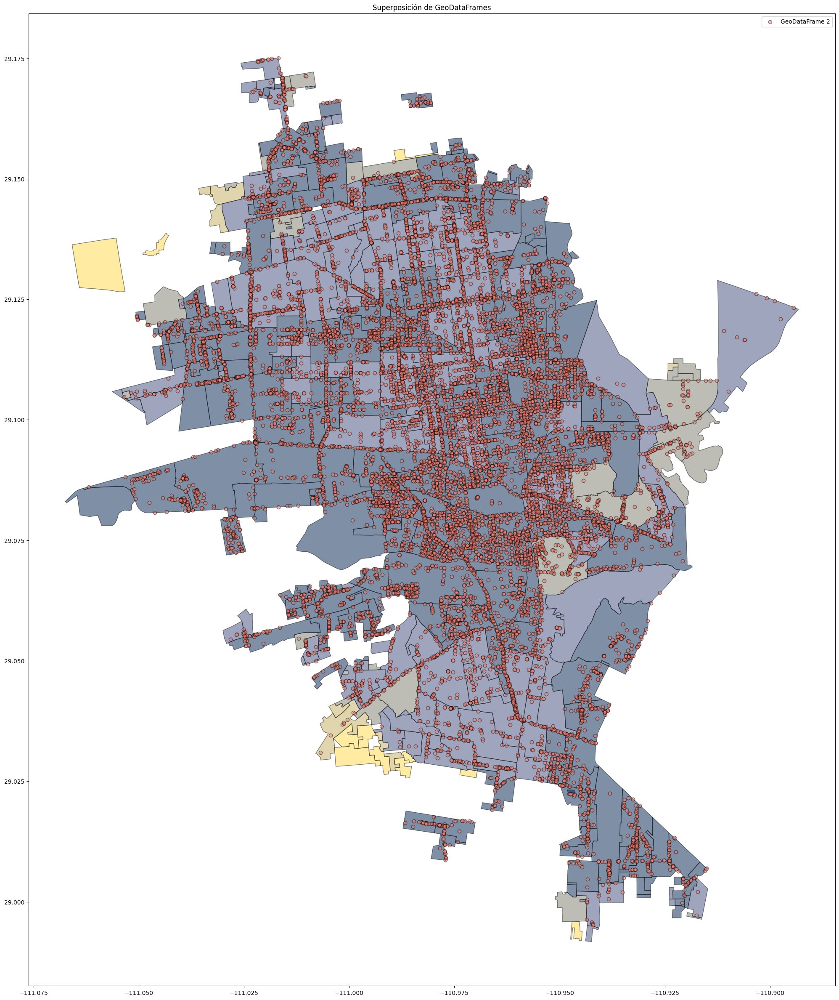

In [53]:
fig, ax = plt.subplots(figsize=(30,30))
se_ageb[se_ageb.GM_2020 == 'Muy alto'].plot(ax=ax, color="#FFD945", edgecolor="black", alpha=0.5)
se_ageb[se_ageb.GM_2020 == 'Alto'].plot(ax=ax, color="#C2AC5C", edgecolor="black", alpha=0.5)
se_ageb[se_ageb.GM_2020 == 'Medio'].plot(ax=ax, color="#7D7D6E", edgecolor="black", alpha=0.5)
se_ageb[se_ageb.GM_2020 == 'Bajo'].plot(ax=ax, color="#414C7D", edgecolor="black", alpha=0.5)
se_ageb[se_ageb.GM_2020 == 'Muy bajo'].plot(ax=ax, color="#00224E", edgecolor="black", alpha=0.5)

baches.plot(ax=ax, color="salmon", edgecolor="black", alpha=0.5, label="GeoDataFrame 2")

# Agregar leyenda y título
plt.legend()
plt.title("Superposición de GeoDataFrames")
plt.show()

In [54]:
hmo_via =  gpd.read_file(directorio + '/data/raw/260300001v.shp')
hmo_via= hmo_via.to_crs("EPSG:4326")

<Axes: >

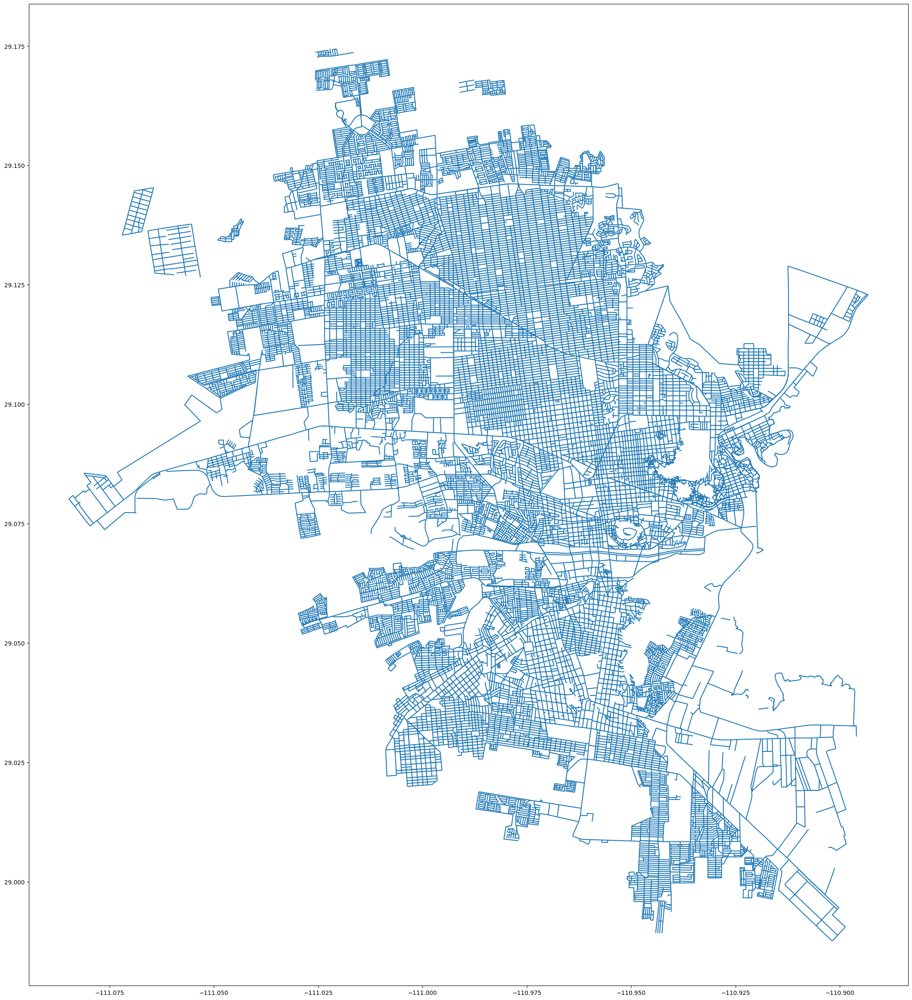

In [55]:
hmo_via.plot(figsize=(30,30))

/var/folders/k1/mgsx4x9n5zb6hdwy4z831rrw0000gn/T/ipykernel_7848/896508431.py:6: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  plt.legend()


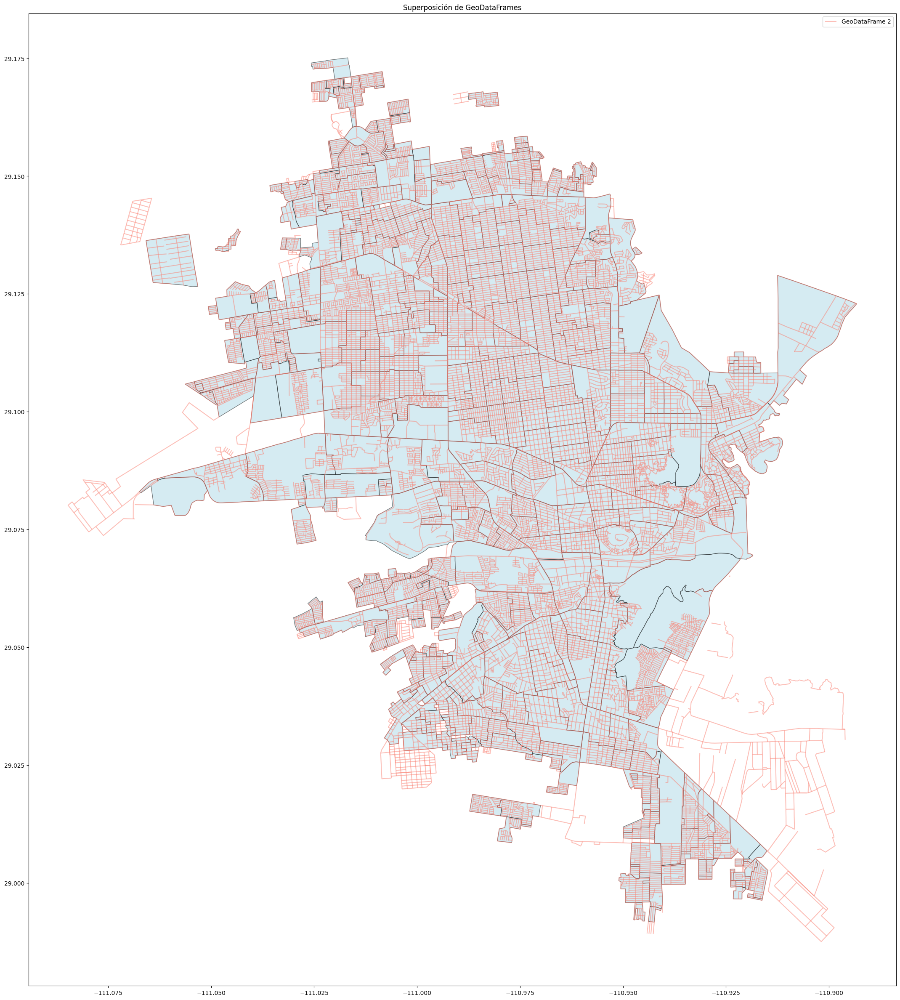

In [56]:
fig, ax = plt.subplots(figsize=(30,30))
se_ageb.plot(ax=ax, color="lightblue", edgecolor="black", alpha=0.5, label="GeoDataFrame 1")
hmo_via.plot(ax=ax, color="salmon", edgecolor="black", alpha=0.5, label="GeoDataFrame 2")

# Agregar leyenda y título
plt.legend()
plt.title("Superposición de GeoDataFrames")
plt.show()

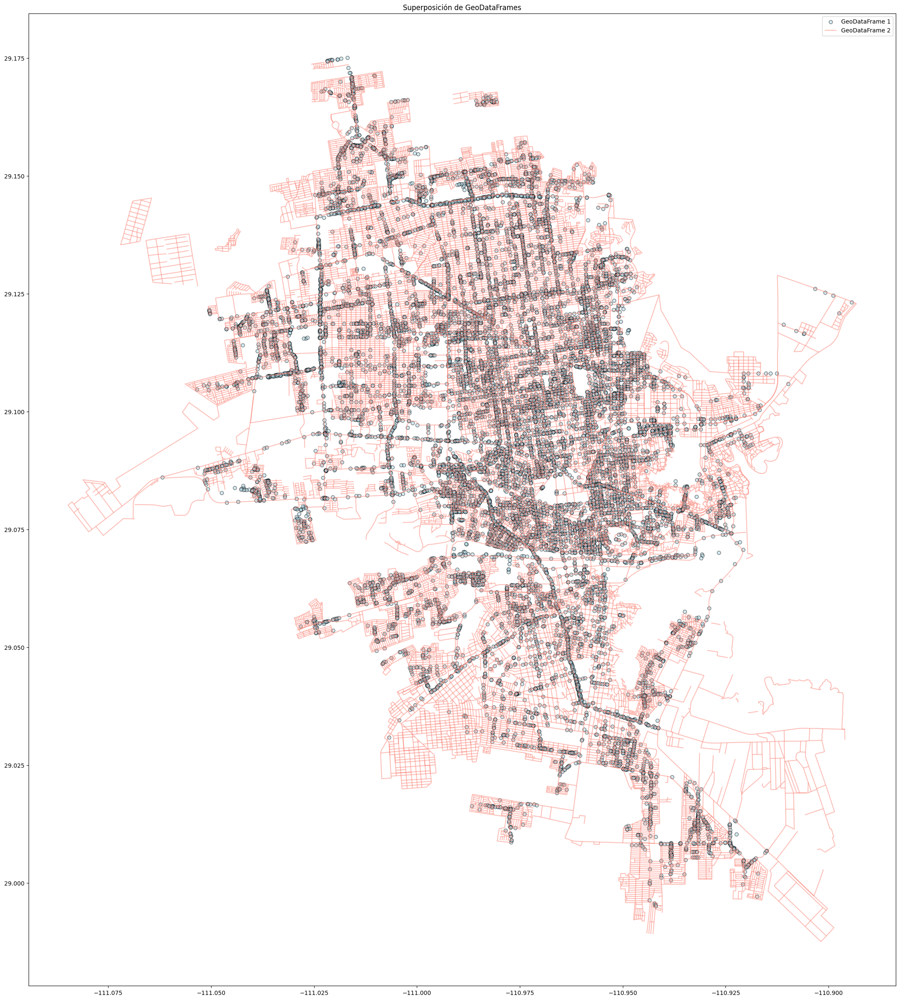

In [57]:
fig, ax = plt.subplots(figsize=(30,30))
baches[baches['CVEGEO'].isin(se_ageb.CVEGEO.to_list())].plot(ax=ax, color="lightblue", edgecolor="black", alpha=0.5, label="GeoDataFrame 1")
hmo_via.plot(ax=ax, color="salmon", edgecolor="black", alpha=0.5, label="GeoDataFrame 2")

# Agregar leyenda y título
plt.legend()
plt.title("Superposición de GeoDataFrames")
plt.show()

Lo que estamos haciendo a continuacion es hacer un buffer de 8 metros, diremos que si un bache esta en la una calle si el punto geometrico del bache esta dentro del buches de la calle

In [58]:
hmo_via = hmo_via.to_crs('EPSG:32612')
baches = baches.to_crs('EPSG:32612')
vialidades_buffer = hmo_via.copy()
vialidades_buffer = vialidades_buffer.to_crs("EPSG:32612")


vialidades_buffer["geometry"] = hmo_via.buffer(8)  


puntos_en_vialidades = gpd.sjoin(baches, vialidades_buffer, predicate="within")

Agrupamos por el nombre de la calle y por punto geometrico

In [59]:
puntos = puntos_en_vialidades.groupby(['NOMVIAL','geometry'],as_index=False).size().sort_values(by="size", ascending=False)
puntos.head(15)

,NOMVIAL,geometry,size
5834,GENERAL BERNARDO REYES,POINT (503140.274 3223351.201),3
2238,CAMINO DEL SERI,POINT (499297.443 3214548.572),3
2556,CARLOS QUINTERO ARCE,POINT (499434.867 3217130.954),3
3313,DE LA REFORMA,POINT (503012.279 3219389.795),3
3318,DE LA REFORMA,POINT (502983.199 3219626.231),3
3624,DE LAS DUNAS,POINT (497308.599 3219306.442),3
1204,ALFAREZ JUAN BAUTISTA DE ESCALANTE Y/ O PROGRESO,POINT (498736.963 3223863.064),3
5697,GASPAR LUKEN ESCALANTE,POINT (497306.947 3221543.648),3
5698,GASPAR LUKEN ESCALANTE,POINT (497302.169 3221554.35),3
5699,GASPAR LUKEN ESCALANTE,POINT (497302.144 3221556.372),3


Tomamos las 20 calles con mmayor numero de baches

In [61]:
calles_baches = puntos_en_vialidades.groupby(['NOMVIAL','geometry'],as_index=False).size().sort_values(by="size", ascending=False)
calles_baches = calles_baches.groupby('NOMVIAL', as_index=False)['size'].sum()

In [62]:
calles_baches = calles_baches.sort_values(by="size",ascending=False)[calles_baches.NOMVIAL != "NINGUNO"] \
                                                    ['NOMVIAL'].head(20).to_list()

/var/folders/k1/mgsx4x9n5zb6hdwy4z831rrw0000gn/T/ipykernel_7848/1262059468.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  calles_baches = calles_baches.sort_values(by="size",ascending=False)[calles_baches.NOMVIAL != "NINGUNO"] \


Hacemos un html que nos marque las 20 calles con un mayor número de baches en Hermosillo

In [63]:
latitud_centro = 29.072967
longitud_centro = -110.955919

# Filtrar las 20 calles con más baches
top_20_baches =  hmo_via[hmo_via['NOMVIAL'].isin(calles_baches)]

# Crear el mapa centrado en Hermosillo
m = folium.Map(location=[latitud_centro, longitud_centro], zoom_start=12)

# Añadir las vialidades generales al mapa
folium.GeoJson(
    hmo_via,
    name="Vialidades",
    style_function=lambda x: {'color': 'grey', 'weight': 1},
).add_to(m)

# Añadir las calles con más baches y resaltar
highlight = GeoJson(
    top_20_baches,
    name="Calles con más baches",
    style_function=lambda x: {'color': 'red', 'weight': 3},
    tooltip=GeoJsonTooltip(fields=['NOMVIAL'], aliases=['Calle:'])
)
highlight.add_to(m)

# Añadir controles de capa y mostrar el mapa
folium.LayerControl().add_to(m)

m.save(os.path.dirname(os.getcwd()) + "/images/mapa_baches.html")


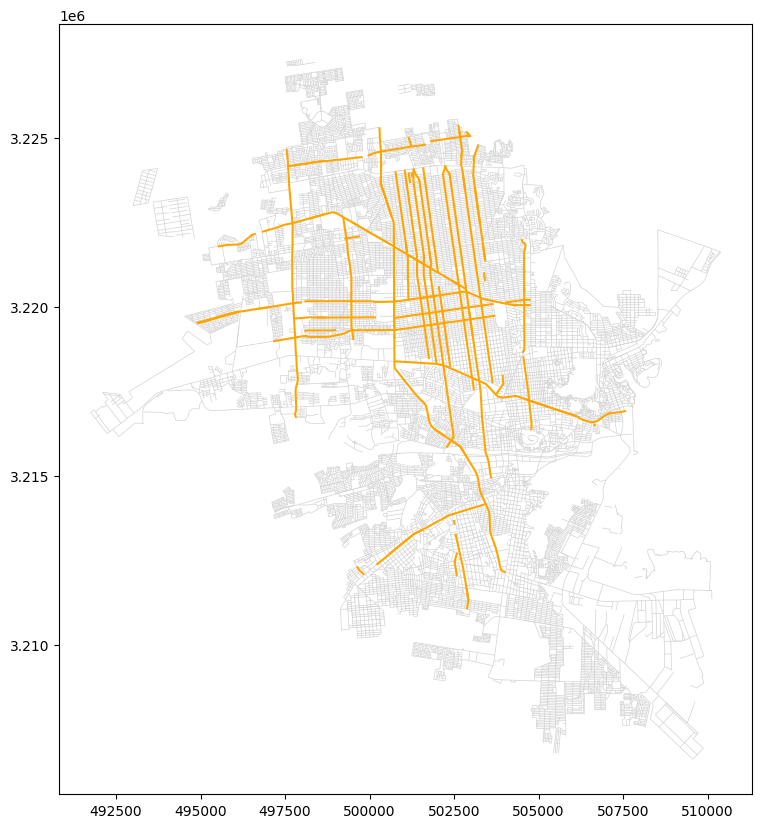

In [64]:
hmo_via['es_destacada'] = hmo_via['NOMVIAL'].isin(calles_baches)

# Graficar
fig, ax = plt.subplots(figsize=(10, 10))
hmo_via[~hmo_via['es_destacada']].plot(ax=ax, color='lightgrey', edgecolor='black', linewidth=0.5)  # Colonias no destacadas
hmo_via[hmo_via['es_destacada']].plot(ax=ax, color='orange', edgecolor='red', linewidth=1.5)        # Colonias destacadas

plt.show()
hmo_via = hmo_via.drop(columns=['es_destacada'])